# Clustering Analysis of Potential Locations for Virtual Hotel Business Expansion in South Jakarta, Indonesia

### Capstone Project for IBM Data Science Professional Certificate
### By Imam Hadrazi Baihaki

## Introduction


### Preface

Low budget traveling and staycation has become a common needs for young people in Indonesia, espescially in its capital city, Jakarta. To accomodate this needs, several virtual hotel operators (e.g., OYO, RedDoorz, and Airy) have rapidly developed their business in this city. This type of accommodation has become a favorite choice amongst travelers because its simplicity, easyness to book, and lower price compared to other hotel operators. 

South Jakarta is a very promising area to develop this kind of business. There are plenty of popular restaurants, caffees, shopping malls, nightlife entertainments, and other interesting places in this area that would attract guests to stay in this area. But, opening a new business unit in this area does not guarantee that it will be a pleasant place to stay for the guests. It has to be opened in the right, strategic location so guests can have great experience while staying. 

Fortunately, Google Map, a popular navigation app can accomodate its users to give to rate any particular places, including hotels. The rating value ranges from 0 to 5, where 0 means very unpleasant an 5 means excellent satisfatory. These ratings is considerable to be used as satisfactory measurement by hotel guests.

### Project Goal

In this project, we will develop a classification machine learning model to determine whether each particular location shall be a promising location for the hotel business to expand, or not. Moreover, this project aims to find locations that will have 4-5 rating if a new hotel built in each particular location. And then, we will create clusters of potential area for opening a new OVO franchise.

The influencing factors for the rating will be the number of points of interest nearby the hotel. The type of POIs can be places to eat and drink, places to hang out, places to get basic needs (e.g., kiosks, shopping centers, ATM, etc), and transportation facilities.

## Data Collection

Based on our project purpose, at first, we need to extract all virtual hotel operator's franchises in South Jakarta area. Then, we will explore how many POIs are located within a walking distance from the hotel. The sources of the location data are:
* Google Geocoding API (https://developers.google.com/maps/documentation/geocoding/overview)
* Google Places API (https://developers.google.com/places/web-service/overview)
* Here Map API (https://developer.here.com/)

### Creating Functions for Geocoding, Projection Convertion, And Distance Calculation
The function created below will be used to extract latitude and longitude coordinates, given any location name. This process will use Google's Geocoding API service. Let's test it to locate South Jakarta's coordinate.

In [1]:
# Insert your API Keys

api_key = 'Your Google API Key'
here_api_key = 'Your Here API Key'

In [2]:
import requests
from urllib.parse import urlencode

def extract_coord(location_name, datatype = 'json'):
    data_type = 'json'
    endpoint = f'https://maps.googleapis.com/maps/api/geocode/{data_type}'
    params = {'address' : location_name, 'key' : api_key}
    url_params = urlencode(params)
    url = f'{endpoint}?{url_params}'
    r = requests.get(url)

    if r.status_code not in range(200, 299):
        return {}

    try:
        key_info = r.json()['results'][0]
        lat = key_info['geometry']['location']['lat']
        lng = key_info['geometry']['location']['lng']

    except:
        lat = 'None'
        lng = 'None'

    return  {'Location' : location_name, 'Latitude' : lat, 'Longitude' : lng}

location_name = 'South Jakarta, Jakarta'
south_jakarta = extract_coord(location_name)
SJ_lat = south_jakarta['Latitude']
SJ_lng = south_jakarta['Longitude']

print('Centre of {} is ({}, {})'.format(location_name, SJ_lat, SJ_lng))

Centre of South Jakarta, Jakarta is (-6.2614927, 106.8105998)


Next step, we will creat a function to measure distancw between two locations. As we use euclidean method to measure distances, it has to projected on UTM first. Therefore, we will need to have a function to change projection first, then calculate he distance using coordinate that has been projected from WGS84 to UTM.

In [3]:
#!pip install shapely
#!pip install pyproj
#!pip install utm

import shapely
import pyproj
import math
import utm

def WGS84_to_UTM(lng, lat):
    proj_degree = pyproj.Proj(proj='latlong',datum='WGS84')
    proj_utm = pyproj.Proj(proj="utm", zone=48, datum='WGS84')
    UTM_coord = pyproj.transform(proj_degree, proj_utm, lng, lat)
    return UTM_coord[0], UTM_coord[1]

def UTM_to_WGS84(x, y):
    proj_degree = pyproj.Proj(proj='latlong',datum='WGS84')
    proj_utm = pyproj.Proj(proj="utm", zone=48, datum='WGS84')
    WGS84_degree = pyproj.transform(proj_utm, proj_degree, x, y)
    return WGS84_degree[1], WGS84_degree[0]

def get_distance(x1, y1, x2, y2):
    dx = x2 - x1
    dy = y2 - y1
    return math.sqrt((dx * dx) + (dy * dy))

SJ_UTM = WGS84_to_UTM(SJ_lng, SJ_lat)
SJ_X, SJ_Y = SJ_UTM[0], SJ_UTM[1]
SJ_WGS84 = UTM_to_WGS84(SJ_X, SJ_Y)
SJ_lat2, SJ_lng2 = SJ_WGS84[0], SJ_WGS84[1]

print('Initial WGS84 coordinate: {}, {}'.format(SJ_lat, SJ_lng))
print('Initial UTM coordinate converted from WGS84: {}, {}'.format(SJ_X, SJ_Y))
print('WGS84 coordinate converted from UTM: {}, {}'.format(SJ_lat2, SJ_lng2))

Initial WGS84 coordinate: -6.2614927, 106.8105998
Initial UTM coordinate converted from WGS84: 700313.2690391368, -692455.9649033927
WGS84 coordinate converted from UTM: -6.261492699999998, 106.8105998


Seems the function works very well. From the result above, we tried to convert initial coordinate of South Jakarta from WGS84 projection into UTM projection. And then, we managed to re-convert it back to WGS84 projection

### Hotel Location Data Collection
Next step, we will extract all virtual hotel franchises located in South Jakarta Area. In this project, we will have an area of observation with radius of 6 kilometers from the central coordinate. Google Places API service shall be used to extract these hotel locations.
Every search request will return 20 locations. Therefore, we will create several inner search boundaries to be able to extract all hotels

To create several search boundaries, we will first create a function to generate circles. These circles will be referred as search clusters.

In [4]:
def create_circles(center_lat, center_lng, boundary_rad, inner_rad):
    
    boundary_radius = boundary_rad
    boundary_diameter = boundary_radius * 2
    inner_radius = inner_rad
    sep = inner_radius * 2
    grids_x = int(boundary_diameter / sep) + 1
    grids_y = int(boundary_diameter / sep / (math.sqrt(3) / 2)) + 1
    offset = math.sqrt(2 * pow(sep, 2))

    Xmin = WGS84_to_UTM(center_lng, center_lat)[0] - boundary_radius - sep
    Xmax = WGS84_to_UTM(center_lng, center_lat)[0] + boundary_radius
    Ymin = WGS84_to_UTM(center_lng, center_lat)[1] - boundary_radius
    Ymax = WGS84_to_UTM(center_lng, center_lat)[1] + boundary_radius

    inner_x = []
    inner_y = []
    inner_lat = []
    inner_lng = []

    for i in range(1, grids_x + 2):
        for j in range(1, grids_y + 1):
            x = Xmin + sep * (i - 1) + ((j % 2) * sep / 2)
            y = Ymin + sep * (j - 1) * math.sqrt(3) / 2
            lat = UTM_to_WGS84(x, y)[0]
            lng = UTM_to_WGS84(x, y)[1]
            
            if get_distance(SJ_X, SJ_Y, x, y) < boundary_radius:   
                inner_x.append(x)
                inner_y.append(y)
                inner_lat.append(lat)
                inner_lng.append(lng)

    return {'Inner Latitude' : inner_lat, 'Inner Longitude' : inner_lng}


After the function is created, let's use it to generate several search areas within our whole observation area. Each search area will have equal radius of 500 meters. Let's try and plot it to the map.

In [5]:
import folium

boundary_radius = 6000
inner_radius_1 = 500

circles_1 = create_circles(SJ_lat, SJ_lng, boundary_radius, inner_radius_1)

SJ_map = folium.Map(location = [SJ_lat, SJ_lng], zoom_start = 13)
folium.TileLayer('cartodbpositron').add_to(SJ_map) 
folium.Marker([SJ_lat, SJ_lng], popup= 'South Jakarta, Indonesia').add_to(SJ_map)
folium.Circle([SJ_lat, SJ_lng], 
                    radius = boundary_radius, 
                    color = 'blue',
                    fill = True,
                    fill_color = 'white').add_to(SJ_map)

for lat, lng in zip(circles_1['Inner Latitude'], circles_1['Inner Longitude']):
    folium.Circle([lat, lng],
    radius = inner_radius_1,
    color = 'red').add_to(SJ_map)

SJ_map

The figure above shows that we have successfuly generated equally spaced and not intersecting search areas. We will transform it into table named df_clusters and look the first 5 rows of the data.

In [6]:
import pandas as pd 

df_clusters = pd.DataFrame(list(zip(range(1, len(circles_1['Inner Latitude'])), circles_1['Inner Latitude'], circles_1['Inner Longitude'])), columns = ['Cluster ID', 'Latitude', 'Longitude'])

print('total search areas extracted: {} areas'.format(df_clusters.shape[0]))
df_clusters.head()

total search areas extracted: 122 areas


,Cluster ID,Latitude,Longitude
0,1,-6.268930,106.760927
1,2,-6.253269,106.760874
2,3,-6.284561,106.770016
3,4,-6.276745,106.765471
4,5,-6.268900,106.769963


From the previous step, we managed to generate 122 searh areas. These areas have centroids that will be required for the next step. Then we will utilize Google's Places API service to search particular locations within the search areas. 

We will create a funcion to serve our purpose, this is called "search nearby". we will name the function as get_nearby and it will need parameters as:
* Center's latitude,
* Center's longitude,
* Search radius, and
* Keyword

In [7]:
def get_nearby(lat, lng, radius, keyword):
    nearby_endpoint = 'https://maps.googleapis.com/maps/api/place/nearbysearch/json'
    params_nearby = {
        'key' : api_key,
        'location' : f'{lat},{lng}',
        'radius' : radius,
        'keyword' : keyword
    }
    params_nearby_encoded = urlencode(params_nearby)
    places_url = f'{nearby_endpoint}?{params_nearby_encoded}'
    r = requests.get(places_url)
    r_json = r.json()['results']
    return r_json

Time for the function to work! we will use it to all search areas that we have generated. As we are interested to find virtual hotel operators franchises within the area, we will pass the operator's name in the keyword (Airy, OYO, and RedDoorz).

The function will return so many informations for each location extracted, but for the purpose of this project, we only need to extract these information:
* Location's latitude
* Location's longitude
* Location's rating
* Location's total user ratings

As we are extracting the location's rating, we will not extract the hotel's name for confidentialty reason. But we will assign a unique ID for each hotel.

This process might take a quite long time to run, so just let it work and have a cup of coffee! Or maybe two :)

In [8]:
point_lat = []
point_lng = []
point_rating = []
point_tot_rating = []

provider = ['Airy', 'OYO', 'Reddoorz']

for prov in zip(provider):

    for i, lat, lng in zip(df_clusters['Cluster ID'], df_clusters['Latitude'], df_clusters['Longitude']):
        r_json = get_nearby(lat, lng, inner_radius, prov)
        
        for j in range(0, len(r_json)):
            try:
                point_lat.append(r_json[j]['geometry']['location']['lat'])
                point_lng.append(r_json[j]['geometry']['location']['lng'])
                point_rating.append(r_json[j]['rating'])
                point_tot_rating.append(r_json[j]['user_ratings_total'])
            except:
                pass

df_hostel = pd.DataFrame(list(zip(range(1, len(point_name)),
                                point_lat, 
                                point_lng,
                                point_rating,
                                point_tot_rating)),
                        columns = ['Hostel ID', 'Hostel Name', 'Latitude', 'Longitude','Rating', 'Total Ratings'])

print('Total hotel informations extracted: {}'.format(df_hostel.shape[0]))
df_hostel.head()

Total hotel informations extracted: 275


,Hostel ID,Latitude,Longitude,Rating,Total Ratings
0,1,-6.238053,106.816953,3.6,218
1,2,-6.234102,106.817169,5.0,2
2,3,-6.243214,106.781500,4.5,20
3,4,-6.244997,106.780350,2.7,3
4,5,-6.243362,106.780622,3.2,45


The wait is over!
So far we have extracted 275 hotels with our criteria. We will plot it to the map below.

In [9]:
SJ_map = folium.Map(location = [SJ_lat, SJ_lng], zoom_start = 13)
folium.TileLayer('cartodbpositron').add_to(SJ_map) 

for name, lat, lng in zip(df_hostel['Hostel ID'], df_hostel['Latitude'], df_hostel['Longitude']) :
    folium.Marker([lat, lng],
                    popup = name).add_to(SJ_map)
SJ_map

Well, it looks good, so this is the end for this step and time to move on for the next.

### POI Data Collection

After we managed to extract hotels information, we will then need to extract all POI that located within our area of observation. In this step, we will utilize Here Map's API to extract POIs within the search area.

Asides from the API service that we will use, the process will be the same as the way we extracted hotels information. But, as this search will return a lot more data than the previous, we will need to have narrower search areas. This is because the API returns maximum 100 places for each search and we need to ensure that we extracted all POIs within our search area.

So we will generate another sets of search areas with radius of 300 meters equally spreaded within our area of observation.

In [10]:
boundary_diameter = 6000
inner_radius_2 = 300

circles_2 = create_circles(SJ_lat, SJ_lng, boundary_diameter, inner_radius_2)

SJ_map = folium.Map(location = [SJ_lat, SJ_lng], zoom_start = 13)
folium.Marker([SJ_lat, SJ_lng], popup= 'South Jakarta, Indonesia').add_to(SJ_map)
folium.TileLayer('cartodbpositron').add_to(SJ_map) 
folium.Circle([SJ_lat, SJ_lng], 
                    radius = boundary_radius, 
                    color = 'blue',
                    fill = True,
                    fill_color = 'white').add_to(SJ_map)

for lat, lng in zip(circles_2['Inner Latitude'], circles_2['Inner Longitude']):
    folium.Circle([lat, lng],
    radius = inner_radius_2,
    color = 'red').add_to(SJ_map)

SJ_map

Figure above shows that we have a new set of search areas generated.
Within each search area, we will start looking for POIs that exist in there. First, we will create a function that utilize Here Map's API to explore nearby location. 

The parameters neede to be pased are:
* Your Here Map API key
* Center's latitude
* Center's longitude
* Search radius
* Search category

Each request will return multiple locations with many information for it. In this project, we will only need to extract these informations:
* POI's name
* POI's category
* POI's sub-category
* POI's latitude
* POI's longitude

The documentation for using he API can be found in this page.
https://developer.here.com/documentation/places/dev_guide/topics/explore-nearby-places.html


In [11]:
def explore_here(latitude, longitude, radius, category):
    
    endpointhere = 'https://places.ls.hereapi.com/places/v1/discover/explore'
    paramshere = {
        'apikey' : here_api_key,
        'in' : '{},{};r={}'.format(latitude, longitude, radius),
        'cat' : '{}'.format(category)
    }
    urlhereparams = '{}&pretty'.format(urlencode(paramshere))
    urlhere = '{}?{}'.format(endpointhere, urlhereparams)

    POI_name = []
    category = []
    sub_category = []
    latitude = []
    longitude = []

    try: 
        result = requests.get(urlhere).json()['results']
        result_item = result['items']

        if 'next' in result.keys():
            while 'next' in result.keys():
                next_url = result['next']
                result = requests.get(next_url).json()
                # next_result = result['results']
                next_result_item = result['items']
                result_item = result_item + next_result_item

        if len(result_item) > 0:
            try:
                for i in range(0, len(result_item)):
                    POI_name.append(result_item[i]['title'])
                    category.append(result_item[i]['category']['id'])
                    sub_category.append(result_item[i]['category']['title'])
                    latitude.append(result_item[i]['position'][0])
                    longitude.append(result_item[i]['position'][1])
            except:
                pass
    
    except:
        pass

    return {
        'POI Name' : POI_name,
        'Category' : category,
        'Sub Category' : sub_category,
        'Latitude' : latitude,
        'Longitude' : longitude
    }

As we had successfuly created the function, we will use it in each search area. We are going to extract POIs that fit these search category:
* eat-drink
* going-out
* transport
* shopping
* atm-bank-exchange

The documentation that covers available search category can be found in this page
https://developer.here.com/documentation/places/dev_guide/topics/categories.html


In [12]:
POI_name = []
POI_category = []
POI_sub_category = []
POI_latitude = []
POI_longitude = []
query = []

search_category = ['eat-drink', 'going-out', 'transport', 'shopping', 'atm-bank-exchange']

for lat,lng in zip(circles_2['Inner Latitude'], circles_2['Inner Longitude']):

    for i in range(0, len(search_category)):
        cat = search_category[i]

        results = explore_here(lat, lng, inner_radius_2, cat)
        
        if len(results['POI Name']) > 0:
            
            for j in range(0, len(results['POI Name'])):

                POI_name.append(results['POI Name'][j])
                POI_category.append(results['Category'][j])
                POI_sub_category.append(results['Sub Category'][j])
                POI_latitude.append(results['Latitude'][j])
                POI_longitude.append(results['Longitude'][j])
                query.append(cat)

extracted_POIs = {
    'POI Name' : POI_name,
    'Category' : POI_category,
    'Sub Category' : POI_sub_category,
    'Latitude' : POI_latitude,
    'Longitude' : POI_longitude,
    'Query' : query
}

df_POI = pd.DataFrame(extracted_POIs)

print('POIs information within the area of observation has been extracted')
df_POI.head()

POIs information within the area of observation has been extracted


,POI Name,Category,Sub Category,Latitude,Longitude,Query
0,Sari Indah Masakan Padang,restaurant,Restaurant,-6.270770,106.758840,eat-drink
1,Dapoer Roti Bakar,restaurant,Restaurant,-6.267890,106.758070,eat-drink
2,Sambel Desa,restaurant,Restaurant,-6.270595,106.759003,eat-drink
3,Mie & You Baim Wong,restaurant,Restaurant,-6.270710,106.758720,eat-drink
4,Fish Streat,restaurant,Restaurant,-6.270710,106.758720,eat-drink


We managed to extract POIs information from each search area. Next step, we will shortlist the POIs based on their sub-category so we will keep the POIs that relevant to our project purpose.

In [13]:
df_POI['Category'].unique()

array(['restaurant', 'snacks-fast-food', 'going-out',
       'hardware-house-garden-shop', 'kiosk-convenience-store', 'shop',
       'electronics-shop', 'food-drink', 'atm-bank-exchange',
       'coffee-tea', 'clothing-accessories-shop', 'theatre-music-culture',
       'hotel', 'bar-pub', 'pharmacy', 'sport-outdoor-shop', 'mall',
       'bookshop', 'hospital-health-care-facility', 'public-transport',
       'department-store', 'taxi-stand', 'dance-night-club', 'cinema',
       'facility', 'building', 'railway-station', 'museum',
       'business-services', 'eat-drink', 'sports-facility-venue',
       'amusement-holiday-park', 'casino', 'accommodation',
       'wine-and-liquor', 'sights-museums', 'education-facility',
       'government-community-facility', 'ferry-terminal',
       'petrol-station'], dtype=object)

In [14]:
cat_exclusion = [
    "going-out", "hardware-house-garden-shop", "shop", "electronics-shop", "clothing-accessories-shop", "hotel", "sport-outdoor-shop",
    "hospital-health-care-facility", "facility", "business-services", "eat-drink", "sports-facility-venue", "accommodation", 
    "casino", "building", "education-facility", "government-community-facility", "ferry-terminal"
    ]

df_POI_filtered = df_POI[~df_POI['Category'].isin(cat_exclusion)].reset_index(drop = True)
df_POI_filtered[df_POI_filtered['Sub Category'] == 'Eat & Drink']['Sub Category'] = 'Food & Drink'
df_POI_filtered['Sub Category'].unique()

array(['Restaurant', 'Snacks/Fast food', 'Kiosk/24-7/Convenience Store',
       'Food & Drink', 'ATM/Bank/Exchange', 'Coffee/Tea',
       'Theatre, Music & Culture', 'Bar/Pub', "Chemist's",
       'Shopping Centre', 'Book Shop', 'Public Transport',
       'Department Store', 'Taxi Stand', 'Dance or Nightclub', 'Cinema',
       'Railway Station', 'Museum', 'Theme Park', 'Wine & Spirits',
       'Sights & Museums', 'Petrol Station'], dtype=object)

Looking good, we have shortlisted the POI sub-categories that we desired. Then, we will remove duplicates if there's any.

In [15]:
df_POI = df_POI_filtered.drop(columns = ['Query','Category'])
df_POI.drop_duplicates(subset = ['POI Name', 'Sub Category'], keep = 'first', inplace = True)
df_POI.reset_index(drop = True, inplace = True)

print('Number of POIs in the dataset: {} records'.format(df_POI.shape[0]))
df_POI.head()

Number of POIs in the dataset: 9144 records


,POI Name,Sub Category,Latitude,Longitude
0,Sari Indah Masakan Padang,Restaurant,-6.270770,106.758840
1,Dapoer Roti Bakar,Restaurant,-6.267890,106.758070
2,Sambel Desa,Restaurant,-6.270595,106.759003
3,Mie & You Baim Wong,Restaurant,-6.270710,106.758720
4,Fish Streat,Restaurant,-6.270710,106.758720


At last, we have successfully extracted 9144 records of POI information that sreaded out within our area of observation.

## Exploring Nearby POI Location for Each Hotel

The next stage will be counting how many POIs are located within walking distance (500 meters) for each hotel. The count will be grouped by POI categories. These number will later be the explanatory variables to predict the hotel's rating.

Let's get it started by plotting all hotel and POI locations in a map

In [16]:
import random

def rgb_to_hex(rgb):
    hex = '%02x%02x%02x' % rgb
    return '#{}'.format(hex)

subcat = []
hex_color = []

for i in range(0, len(df_POI['Sub Category'].unique())):

    sub = df_POI['Sub Category'].unique()[i]
    r = int(random.random() * 255)
    b = int(random.random() * 255)
    g = int(random.random() * 255)
    color_rgb = (r, g, b)
    hex = rgb_to_hex(color_rgb)

    subcat.append(sub)
    hex_color.append(hex)

color_map = {
    'Sub Category' : subcat,
    'Hex Color' : hex_color
}

SJ_map = folium.Map(location = [SJ_lat, SJ_lng], zoom_start = 13)
folium.TileLayer('cartodbpositron').add_to(SJ_map) 

for i in range(0, len(color_map['Sub Category'])):
    sub = color_map['Sub Category'][i]
    col = color_map['Hex Color'][i]
    data = df_POI[df_POI['Sub Category'] == color_map['Sub Category'][i]].reset_index(drop = True)

    for j in range(0, data.shape[0]):
        name = data['POI Name'][j]
        lat = data['Latitude'][j]
        lng = data['Longitude'][j]
        folium.Circle(
            location = [lat, lng],
            radius = 30,
            color = col,
            fill = True,
            fill_color = col,
            fill_opacity = 1,
            popup = sub
        ).add_to(SJ_map)

for name, lat, lng in zip(df_hostel['Hostel ID'], df_hostel['Latitude'], df_hostel['Longitude']) :
    folium.Marker(
        location = [lat, lng],
        popup = name
    ).add_to(SJ_map)

SJ_map

Looks pretty well. In order to count nearby POIs, we need to convert the geographical location of all hotels and POIs into X and Y. These converted coordinate will then be used in calculating distance.

Starting with hotels data.

In [17]:
X = []
Y = []

for lat, lng in zip(df_hostel['Latitude'], df_hostel['Longitude']) :
    X.append(WGS84_to_UTM(lng, lat)[0])
    Y.append(WGS84_to_UTM(lng, lat)[1])

df_hostel['X'] = X
df_hostel['Y'] = Y

df_hostel.head()

,Hostel ID,Latitude,Longitude,Rating,Total Ratings,X,Y
0,1,-6.238053,106.816953,3.6,218,701025.341715,-689865.990697
1,2,-6.234102,106.817169,5.0,2,701050.786538,-689429.145487
2,3,-6.243214,106.781500,4.5,20,697099.726580,-690423.437648
3,4,-6.244997,106.780350,2.7,3,696971.731967,-690620.165975
4,5,-6.243362,106.780622,3.2,45,697002.401928,-690439.399461


And to POIs data as well

In [18]:
X = []
Y = []

for lat, lng in zip(df_POI['Latitude'], df_POI['Longitude']) :
    X.append(WGS84_to_UTM(lng, lat)[0])
    Y.append(WGS84_to_UTM(lng, lat)[1])

df_POI['X'] = X
df_POI['Y'] = Y

df_POI.head()

,POI Name,Sub Category,Latitude,Longitude,X,Y
0,Sari Indah Masakan Padang,Restaurant,-6.270770,106.758840,694581.660167,-693462.516116
1,Dapoer Roti Bakar,Restaurant,-6.267890,106.758070,694497.515862,-693143.718376
2,Sambel Desa,Restaurant,-6.270595,106.759003,694599.763456,-693443.222583
3,Mie & You Baim Wong,Restaurant,-6.270710,106.758720,694568.402642,-693455.835907
4,Fish Streat,Restaurant,-6.270710,106.758720,694568.402642,-693455.835907


After we have converted the coordinates data for both hotels and POIs data, we will then iteratively measure distances from each POI location to each hotel locations. We will consider a POI is near to a hotel if the distance is less than 500 meters.

This process might take a really long time to execute, so we can do other things while waiting for the process to be finished.

In [19]:
subs = df_POI['Sub Category'].unique()
radius = 500

h_id = []
h_lat = []
h_lng = []
h_rtg = []
h_tot = []
h_X = []
h_Y = []
h_POIs = []

for i in range(0, df_hostel.shape[0]):
    hostel_id = df_hostel['Hostel ID'][i]
    hostel_lat = df_hostel['Latitude'][i]
    hostel_lng = df_hostel['Longitude'][i]
    hostel_rating = df_hostel['Rating'][i]
    hostel_total_rating = df_hostel['Total Ratings'][i]
    hostel_X = df_hostel['X'][i]
    hostel_Y = df_hostel['Y'][i]
    
    h_id.append(hostel_id)
    h_lat.append(hostel_lat)
    h_lng.append(hostel_lng)
    h_rtg.append(hostel_rating)
    h_tot.append(hostel_total_rating)
    h_X.append(hostel_X)
    h_Y.append(hostel_Y)
    
    POIs = []

    for j in range(0, df_POI.shape[0]):
        POI_sub = df_POI['Sub Category'][j]
        POI_X = df_POI['X'][j]
        POI_Y = df_POI['Y'][j]

        if get_distance(hostel_X, hostel_Y, POI_X, POI_Y) <= radius:
            POIs.append(POI_sub)
    
    POIs = tuple(POIs)
    h_POIs.append(POIs)

res_nearby = {
    'Hostel ID' : h_id,
    'Hostel Latitude' : h_lat,
    'Hostel Longitude' : h_lng,
    'Hostel Rating' : h_rtg,
    'Hostel Total Rating' : h_tot,
    'Hostel X' : h_X,
    'Hostel Y' : h_Y,
    'Hostel POIs' : h_POIs
}


In [20]:
df_nearby = pd.DataFrame(res_nearby)
df_nearby.head()

,Hostel ID,Hostel Latitude,Hostel Longitude,Hostel Rating,Hostel Total Rating,Hostel X,Hostel Y,Hostel POIs
0,1,-6.238053,106.816953,3.6,218,701025.341715,-689865.990697,"(Restaurant, Restaurant, Restaurant, Restauran..."
1,2,-6.234102,106.817169,5.0,2,701050.786538,-689429.145487,"(Restaurant, Restaurant, Restaurant, Restauran..."
2,3,-6.243214,106.781500,4.5,20,697099.726580,-690423.437648,"(Restaurant, Restaurant, Restaurant, Restauran..."
3,4,-6.244997,106.780350,2.7,3,696971.731967,-690620.165975,"(Restaurant, Restaurant, Restaurant, Restauran..."
4,5,-6.243362,106.780622,3.2,45,697002.401928,-690439.399461,"(Restaurant, Restaurant, Restaurant, Restauran..."


From the previous process, we have shortlisted all nearby POI's sub category to each hotel. Next thing to do is to count the number of each POI's sub-category within each hotel.

In [21]:
for i in range(0, df_nearby.shape[0]):
    POI_list = df_nearby['Hostel POIs'][i]
    POI_count_list = []

    for j in range(0, len(subs)):
        sub = subs[j]
        POI_count = POI_list.count(sub)
        POI_count_list.append(POI_count)

    df_nearby['Hostel POIs'][i] = POI_count_list

df_nearby.head()

,Hostel ID,Hostel Latitude,Hostel Longitude,Hostel Rating,Hostel Total Rating,Hostel X,Hostel Y,Hostel POIs
0,1,-6.238053,106.816953,3.6,218,701025.341715,-689865.990697,"[106, 1, 3, 5, 5, 10, 0, 0, 0, 1, 0, 0, 0, 0, ..."
1,2,-6.234102,106.817169,5.0,2,701050.786538,-689429.145487,"[80, 1, 0, 2, 3, 5, 0, 0, 0, 0, 0, 0, 0, 0, 0,..."
2,3,-6.243214,106.781500,4.5,20,697099.726580,-690423.437648,"[88, 3, 7, 1, 13, 9, 2, 2, 1, 4, 2, 0, 0, 0, 0..."
3,4,-6.244997,106.780350,2.7,3,696971.731967,-690620.165975,"[99, 4, 6, 4, 18, 9, 4, 1, 0, 4, 2, 0, 0, 0, 0..."
4,5,-6.243362,106.780622,3.2,45,697002.401928,-690439.399461,"[92, 3, 7, 3, 13, 8, 2, 2, 1, 3, 2, 0, 0, 0, 0..."


In [22]:
count_matrix = {}

for i in range(0, len(df_nearby['Hostel POIs'][0])):
    counts = []

    for j in range(0, df_nearby.shape[0]):
        each = df_nearby['Hostel POIs'][j][i]
        counts.append(each)

    count_matrix['{}'.format(subs[i])] = counts

df_nearby.drop('Hostel POIs', axis = 1, inplace = True)
df_nearby[list(count_matrix.keys())] = pd.DataFrame(count_matrix)

df_nearby.head()

,Hostel ID,Hostel Latitude,Hostel Longitude,Hostel Rating,Hostel Total Rating,Hostel X,Hostel Y,Restaurant,Snacks/Fast food,Kiosk/24-7/Convenience Store,...,Department Store,Taxi Stand,Dance or Nightclub,Cinema,Railway Station,Museum,Theme Park,Wine & Spirits,Sights & Museums,Petrol Station
0,1,-6.238053,106.816953,3.6,218,701025.341715,-689865.990697,106,1,3,...,0,0,0,0,0,0,0,0,0,0
1,2,-6.234102,106.817169,5.0,2,701050.786538,-689429.145487,80,1,0,...,0,0,0,0,0,0,0,0,0,0
2,3,-6.243214,106.781500,4.5,20,697099.726580,-690423.437648,88,3,7,...,0,0,0,2,0,0,0,0,0,0
3,4,-6.244997,106.780350,2.7,3,696971.731967,-690620.165975,99,4,6,...,0,0,0,2,0,0,0,0,0,0
4,5,-6.243362,106.780622,3.2,45,697002.401928,-690439.399461,92,3,7,...,0,0,0,2,0,0,0,0,0,0


Finally, we managed to create a dataframe that consists of hotels informations and the number of POI nearby based on its sub category. 

## Developing Machine Learning for Classification

So far, we have done the data collection stage and we are ready to build machine learning model to predict the hotel's rating based on number of POIs exist nearby. The type of machine learning that we will create is a classification model. In this stage, we wil create various classification models with these method:
* K-nearest Neighbors
* Decision tree
* Support vector machine

We will then test the model and compare the accuracy for each model in forms of jaccad similiarity index and F1 score. We will pick the model that has highest accuracy amongst the other.

In [23]:
import itertools
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import NullFormatter
import numpy as np
import matplotlib.ticker as ticker
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.metrics import jaccard_score
from sklearn.metrics import f1_score
%matplotlib inline

### Data Preprocessing

As our project purpose, we will have hotel's rating as our response variable. This variable's current datatype is float. As we are going to create a classification model to predict the rating, we will have to convert it into discrete variable. Therefore, we will create bins of rating with size of 0.5 and convert the ratings value into its respective bin. For example, a hotel rating with a value of 4.1 will be converted into "4.0 to 4.5".

And also, we will keep the hotels with total numbers of rating more than ten to avoid biassed rating

In [24]:
df_nearby['Hostel Rating']= 0.5 * round(df_nearby['Hostel Rating'] / 0.5)

df_nearby['Hostel Rating'] = ((df_nearby['Hostel Rating'] / 0.5 - 0.01).apply(math.floor) * 0.5).apply(str) + ' to ' +  ((df_nearby['Hostel Rating'] / 0.5).apply(math.ceil) * 0.5).apply(str)

df_nearby = df_nearby[df_nearby['Hostel Total Rating'] > 10]
df_nearby.reset_index(drop = True, inplace = True)

print('Total numbers for observation: {} data'.format(df_nearby.shape[0]))
df_nearby.head()

Total numbers for observation: 201 data


,Hostel ID,Hostel Latitude,Hostel Longitude,Hostel Rating,Hostel Total Rating,Hostel X,Hostel Y,Restaurant,Snacks/Fast food,Kiosk/24-7/Convenience Store,...,Department Store,Taxi Stand,Dance or Nightclub,Cinema,Railway Station,Museum,Theme Park,Wine & Spirits,Sights & Museums,Petrol Station
0,1,-6.238053,106.816953,3.0 to 3.5,218,701025.341715,-689865.990697,106,1,3,...,0,0,0,0,0,0,0,0,0,0
1,3,-6.243214,106.781500,4.0 to 4.5,20,697099.726580,-690423.437648,88,3,7,...,0,0,0,2,0,0,0,0,0,0
2,5,-6.243362,106.780622,2.5 to 3.0,45,697002.401928,-690439.399461,92,3,7,...,0,0,0,2,0,0,0,0,0,0
3,7,-6.287113,106.802778,4.0 to 4.5,72,699437.941700,-695286.539981,14,0,1,...,0,0,0,0,0,0,0,0,0,0
4,8,-6.286095,106.799798,4.0 to 4.5,48,699108.495469,-695172.794202,23,1,2,...,0,0,0,0,0,0,0,0,0,0


It appears that hwe have succesfully converted the hotel rating from continuous into discrete values. And also, after applying filter for total rating, we have 201 records of data that ready to be used. 

Next, we will do some features processing, applying standard scaler, and split the data into train set and test set.

In [25]:
X = df_nearby[subs].values
X[0:5]

array([[106,   1,   3,   5,   5,  10,   0,   0,   0,   1,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0],
       [ 88,   3,   7,   1,  13,   9,   2,   2,   1,   4,   2,   0,   0,
          0,   0,   2,   0,   0,   0,   0,   0,   0],
       [ 92,   3,   7,   3,  13,   8,   2,   2,   1,   3,   2,   0,   0,
          0,   0,   2,   0,   0,   0,   0,   0,   0],
       [ 14,   0,   1,   1,   0,   3,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0],
       [ 23,   1,   2,   3,   7,   4,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0]], dtype=int64)

In [26]:
Y = df_nearby['Hostel Rating'].values
Y[0:5]

array(['3.0 to 3.5', '4.0 to 4.5', '2.5 to 3.0', '4.0 to 4.5',
       '4.0 to 4.5'], dtype=object)

In [27]:
scaler = preprocessing.StandardScaler().fit(X)

X = scaler.fit_transform(X)
X[0:5]

array([[ 1.76048191, -0.58687487,  0.16530454,  0.39274183, -0.08974947,
         1.12148413, -0.80078288, -0.38618963, -0.41027374, -0.15481108,
        -0.59202971, -0.54018382, -0.45204155, -0.44442632, -0.34156503,
        -0.4512126 ,  0.        , -0.12309149, -0.10025094, -0.10025094,
        -0.07071068,  0.        ],
       [ 1.18918192, -0.14424129,  1.46829326, -0.75133219,  1.15436386,
         0.89983387,  1.0928331 ,  0.90754563,  1.14567008,  1.54248131,
         1.25290009, -0.54018382, -0.45204155, -0.44442632, -0.34156503,
         2.21625015,  0.        , -0.12309149, -0.10025094, -0.10025094,
        -0.07071068,  0.        ],
       [ 1.31613747, -0.14424129,  1.46829326, -0.17929518,  1.15436386,
         0.67818362,  1.0928331 ,  0.90754563,  1.14567008,  0.97671718,
         1.25290009, -0.54018382, -0.45204155, -0.44442632, -0.34156503,
         2.21625015,  0.        , -0.12309149, -0.10025094, -0.10025094,
        -0.07071068,  0.        ],
       [-1.1594958 

In [28]:
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size = 0.3, random_state = 10)

print('Train set: {} data'.format(x_train.shape[0]))
print('Test set: {} data'.format(x_test.shape[0]))

Train set: 140 data
Test set: 61 data


So far, we have prepocessed the data and split the ataset into train set and test set. The train set will have 140 records of data and the test set will have 61 records of data.

For the next stage, we will start creating our classification models.

### K Nearest Neighbors

For this model, we will need to find how many ks should be used in the model. We will find it out by iteratively assign the number of k, run the model, and calculate the accuracy. The chosen k should have the highest accuracy. 

In [29]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics

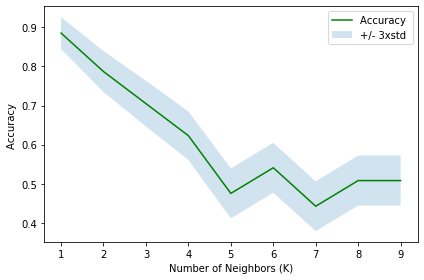

In [30]:
Ks = 10
mean_acc = np.zeros((Ks-1))
std_acc = np.zeros((Ks-1))

for k in range(1, Ks):
    neigh = KNeighborsClassifier(n_neighbors = k).fit(x_train, y_train)
    y_hat = neigh.predict(x_test)
    mean_acc[k-1] = metrics.accuracy_score(y_hat, y_test)
    std_acc[k-1] = np.std(y_hat == y_test) / np.sqrt(y_hat.shape[0])

plt.plot(range(1,Ks),mean_acc,'g')
plt.fill_between(range(1,Ks),mean_acc - 1 * std_acc,mean_acc + 1 * std_acc, alpha=0.2)
plt.legend(('Accuracy ', '+/- 3xstd'))
plt.ylabel('Accuracy ')
plt.xlabel('Number of Neighbors (K)')
plt.tight_layout()
plt.show()

From the plot above, it seems the best number of k is 1. We will develop a KNN model with this value of k in our train dataset, apply the model into the test set, and calculate the accuracy score.

In [31]:
k = 1

KNN_model = KNeighborsClassifier(n_neighbors = k)
KNN_model.fit(x_train, y_train)

y_hat_KNN = KNN_model.predict(x_test)

KNN_jaccard = jaccard_score(y_hat_KNN, y_test, average = 'weighted')
KNN_F1 = f1_score(y_hat_KNN, y_test, average = 'weighted')

print('Jaccard Score: {}'.format(round(KNN_jaccard, 3)))
print('F1 Score: {}'.format(round(KNN_F1, 3)))

Jaccard Score: 0.806
F1 Score: 0.892


And we have successfully created and tested a KNN model with a good accuracy. We will then continue building other two models, decision tree and SVM.

### Decision Tree

As same as previous model, we will create a decision tree classification model using our train dataset, test the model using the test set, and calculate the model's accuracy.

In [32]:
from sklearn.tree import DecisionTreeClassifier

tree_model = DecisionTreeClassifier(criterion = 'entropy', max_depth = 4)
tree_model.fit(x_train, y_train)

y_hat_tree = tree_model.predict(x_test)

C:\Users\Asus\Anaconda3\lib\site-packages\sklearn\externals\six.py:31: DeprecationWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", DeprecationWarning)
Jaccard Score for Decision Tree Model: 0.54
F1 Score for Decision Tree Model: 0.691


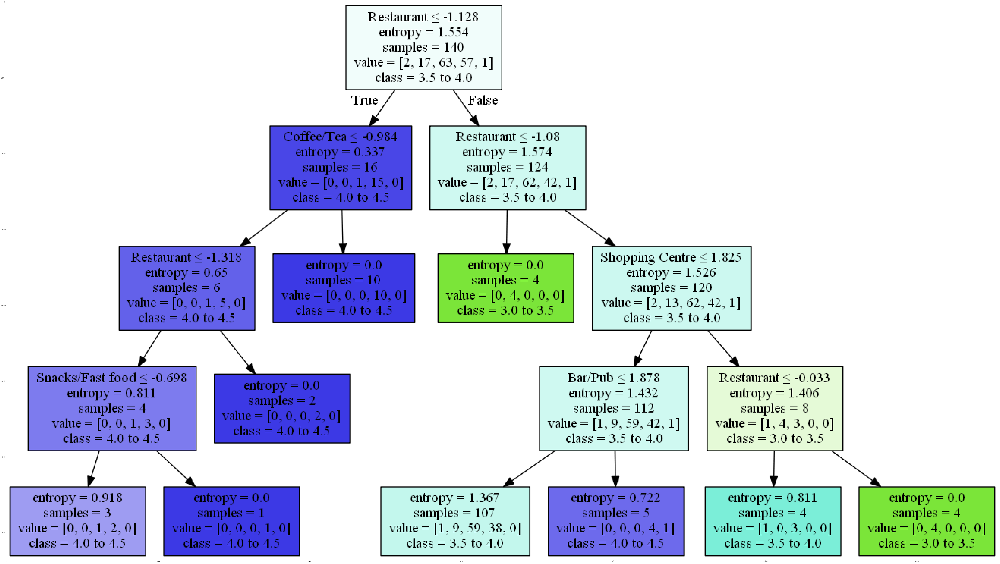

In [33]:
#  !conda install -c conda-forge pydotplus -y
#  !conda install -c conda-forge python-graphviz -y

from sklearn.externals.six import StringIO
import pydotplus
import matplotlib.image as mpimg
from sklearn import tree
%matplotlib inline 

dot_data = StringIO()
filename = 'result_tree.png'
featureNames = df_nearby[subs].columns
targetNames = df_nearby['Hostel Rating'].unique().tolist()

out = tree.export_graphviz(tree_model,
                          feature_names = featureNames,
                          out_file = dot_data,
                          class_names = np.unique(y_train),
                          filled = True,
                          special_characters = True,
                          rotate = False)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png(filename)

img = mpimg.imread(filename)
plt.figure(figsize = (100, 200))
plt.imshow(img, interpolation = 'nearest')

tree_jaccard = jaccard_score(y_hat_tree, y_test, average = 'weighted')
tree_f1 = f1_score(y_hat_tree, y_test, average = 'weighted')

print('Jaccard Score for Decision Tree Model: {}'.format(round(tree_jaccard, 3)))
print('F1 Score for Decision Tree Model: {}'.format(round(tree_f1, 3)))

We have finished created and tested our decision tree classification model and it seems has lower accuracy than the KNN model. Also from the plot above, it appears that the model was not able to predict hotel with 4.5 to 5.0 rating.

We will continue with our remaining model to build, the SVM model.

### Support Vector Machine

Same as previous two models, we will create a SVM model using train set, test it and calculate the accuracy

In [34]:
from sklearn import svm

svm_model = svm.SVC(kernel = 'rbf')
svm_model.fit(x_train, y_train)

y_hat_svm = svm_model.predict(x_test)

svm_jaccard = jaccard_score(y_hat_svm, y_test, average = 'weighted')
svm_f1 = f1_score(y_hat_svm, y_test, average = 'weighted')

print('Jaccard Score for SVM Model: {}'.format(round(svm_jaccard, 3)))
print('F1 Score for SVM Model: {}'.format(round(svm_f1, 3)))

Jaccard Score for SVM Model: 0.539
F1 Score for SVM Model: 0.697


### Best Model Selection

At this stage, we have created three kind of classification models. We will compare each model and choose the best model to be used in this project

In [35]:
Models = ('KNN', 'Decision Tree', 'SVM')
yhats = (y_hat_KNN, y_hat_tree, y_hat_svm)

results = []

for i in range(0, len(Models)) :
    
    results.append(
        {
            'Algorithm': Models[i],
            'Jaccard ' : round(jaccard_score(yhats[i], y_test, average = 'weighted'), 3),
            'F1-score' : round(f1_score(yhats[i], y_test, average = 'weighted'), 3),
        }
    )

results_df = pd.DataFrame(results)
results_df

,Algorithm,Jaccard,F1-score
0,KNN,0.806,0.892
1,Decision Tree,0.540,0.691
2,SVM,0.539,0.697


It appears that the KNN model performs the best compared to other two models. Hence, we will use this model for the next stage.

## Analyzing Location Candidate

So far, we managed to create a KNN models that is pretty accurate. In the next stage, we will use the model to find the promising location for a new hotel to be opened. We are expecting to find location candidates that would bring 4 to 5 rating if the new hotel is opened in the location.

We will also find promising locations that have no franchise exist nearby. Once we have figure out the best locations, we will then extract its address by doing reverse geocoding which is supported by Google's Places API service.

### Generating Location Candidates

As we have done previously when we were exploring hotels and POIs in the area of observation, we will generate several locations inside the boundary as location candidates. Each location candidate will be spaced 50 meters to one another. And then, using the POI dataset that we had acquired, we will explore all POIs that located nearby each candidate.

After having all POIs counted for each candidate, we will use our KNN model to predict the location's rating.

In [36]:
point_radius = 50
search_radius = 500
candidates = create_circles(SJ_lat, SJ_lng, boundary_diameter, point_radius)

print('{} location candidates has created within the boundary'.format(len(candidates['Inner Latitude'])))

13057 location candidates has created within the boundary


### Exploring Nearby POIs for Each Candidate

In [37]:
point_id = []
point_lat = []
point_lng = []
point_x = []
point_y = []
point_POIs = []


for i in range(0, len(candidates['Inner Latitude'])):
    lat = candidates['Inner Latitude'][i]
    lng = candidates['Inner Longitude'][i]
    coord = WGS84_to_UTM(lng, lat)
    x = coord[0]
    y = coord[1]

    point_id.append('Point {}'.format(i+1))
    point_lat.append(lat)
    point_lng.append(lng)
    point_x.append(x)
    point_y.append(y)

    POIs = []
    for j in range(0, df_POI.shape[0]):
        POI_sub = df_POI['Sub Category'][j]
        POI_X = df_POI['X'][j]
        POI_Y = df_POI['Y'][j]

        if get_distance(x, y, POI_X, POI_Y) <= search_radius:
            POIs.append(POI_sub)
    
    POIs = tuple(POIs)
    point_POIs.append(POIs)

res_explore = {
    'Point ID' : point_id,
    'Point Latitude' : point_lat,
    'Point Longitude' : point_lng,
    'Point X' : point_x,
    'Point Y' : point_y,
    'Point POIs' : point_POIs 
}

df_explore = pd.DataFrame(res_explore)

print('POI data for each location candidate has been extracted')
df_explore.head()

POI data for each location candidate has been extracted


,Point ID,Point Latitude,Point Longitude,Point X,Point Y,Point POIs
0,Point 1,-6.267378,106.756855,694363.269039,-693086.607400,"(Restaurant, Restaurant, Restaurant, Restauran..."
1,Point 2,-6.265812,106.756850,694363.269039,-692913.402319,"(Restaurant, Restaurant, Restaurant, Restaurant)"
2,Point 3,-6.264245,106.756845,694363.269039,-692740.197238,"(Restaurant, Restaurant, Restaurant, Restauran..."
3,Point 4,-6.262679,106.756839,694363.269039,-692566.992158,"(Restaurant, Snacks/Fast food, Snacks/Fast foo..."
4,Point 5,-6.261113,106.756834,694363.269039,-692393.787077,"(Snacks/Fast food, Snacks/Fast food, Restauran..."


At this point, we have listed all POIs located nearby to each candidate. We will proceed to count each POIs location sub-category

In [39]:
for i in range(0, df_explore.shape[0]):
    POI_list = df_explore['Point POIs'][i]
    POI_count_list = []

    for j in range(0, len(subs)):
        sub = subs[j]
        POI_count = POI_list.count(sub)
        POI_count_list.append(POI_count)

    df_explore['Point POIs'][i] = POI_count_list

point_count_matrix = {}

for i in range(0, len(df_explore['Point POIs'][0])):
    counts = []

    for j in range(0, df_explore.shape[0]):
        each = df_explore['Point POIs'][j][i]
        counts.append(each)

    point_count_matrix['{}'.format(subs[i])] = counts

df_explore.drop('Point POIs', axis = 1, inplace = True)
df_explore[list(point_count_matrix.keys())] = pd.DataFrame(point_count_matrix)

df_explore.head()

,Point ID,Point Latitude,Point Longitude,Point X,Point Y,Restaurant,Snacks/Fast food,Kiosk/24-7/Convenience Store,Food & Drink,ATM/Bank/Exchange,...,Department Store,Taxi Stand,Dance or Nightclub,Cinema,Railway Station,Museum,Theme Park,Wine & Spirits,Sights & Museums,Petrol Station
0,Point 1,-6.267378,106.756855,694363.269039,-693086.607400,14,2,1,0,7,...,0,0,0,0,0,0,0,0,0,0
1,Point 2,-6.265812,106.756850,694363.269039,-692913.402319,4,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,Point 3,-6.264245,106.756845,694363.269039,-692740.197238,7,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,Point 4,-6.262679,106.756839,694363.269039,-692566.992158,10,2,0,3,0,...,0,0,0,0,0,0,0,0,0,0
4,Point 5,-6.261113,106.756834,694363.269039,-692393.787077,10,3,0,3,0,...,0,0,0,0,0,0,0,0,0,0


Seems good, we have converted the POI list counts for each candidate into features. Next step, we will count how many hotels are located within 750 meters from each candidate. As our goal is not only to find potential places, but it should be apart from other existing hotel. Those candidates that have hotels nearby shall be excluded from the recommendation.

### Detecting Nearby Virtual Hotel Operatos Franchises in Each Candidate

In [40]:
hostel_in_area = []

for x1, y1 in zip(df_explore['Point X'], df_explore['Point Y']):
    n_hostel = 0

    for x2, y2 in zip(df_hostel['X'], df_hostel['Y']):

        if get_distance(x1, y1, x2, y2) < 750:
            n_hostel = n_hostel + 1

    hostel_in_area.append(n_hostel)

df_explore['Hostel Nearby'] = hostel_in_area
print('Hotel detection for each candidate location has been finished')

Hotel detection for each candidate location has been finished


### Features Standard Scaling fo Each Candidate

The candidate dataframe is all set. And we are ready to use our KNN model to it. We will first fit the feature to our predefined standard scaler.

In [41]:
Features = df_explore[subs]
x_final = scaler.fit_transform(Features.values)
x_final[0:3]

array([[-0.95094021, -0.19266684, -0.35394744, -0.93596194,  0.51967868,
        -0.99244322, -0.36737771, -0.27313993, -0.37495361, -0.48078744,
        -0.57131852, -0.51285442, -0.36353638, -0.31203167, -0.24693744,
        -0.33221671, -0.08926529, -0.08469777, -0.1185629 , -0.08237361,
        -0.08331084, -0.08423792],
       [-1.2916259 , -0.75545229, -0.75252369, -0.93596194, -0.69501359,
        -0.99244322, -0.36737771, -0.27313993, -0.37495361, -0.48078744,
        -0.57131852, -0.51285442, -0.36353638, -0.31203167, -0.24693744,
        -0.33221671, -0.08926529, -0.08469777, -0.1185629 , -0.08237361,
        -0.08331084, -0.08423792],
       [-1.18942019, -0.75545229, -0.75252369, -0.93596194, -0.69501359,
        -0.99244322, -0.36737771, -0.27313993, -0.37495361, -0.48078744,
        -0.57131852, -0.51285442, -0.36353638, -0.31203167, -0.24693744,
        -0.33221671, -0.08926529, -0.08469777, -0.1185629 , -0.08237361,
        -0.08331084, -0.08423792]])

### Applying ML Model to Predict Candidate's Rating

After fitting the standard scaler to the features of our candidate dataset, it is time for the KNN model to predict the rating. Then we will exclude all candidates that have hotel franchises located nearby. Let's apply it and see the result

In [42]:
pred_rating = KNN_model.predict(x_final)

df_explore['Predicted Rating'] = pred_rating
df_candidates =  df_explore[df_explore['Hostel Nearby'] == 0]
df_candidates.reset_index(drop = True, inplace = True)

df_candidates[['Point ID', 'Predicted Rating']][10:20]

,Point ID,Predicted Rating
10,Point 17,4.0 to 4.5
11,Point 18,4.0 to 4.5
12,Point 19,4.0 to 4.5
13,Point 20,4.0 to 4.5
14,Point 39,3.0 to 3.5
15,Point 40,4.0 to 4.5
16,Point 41,3.5 to 4.0
17,Point 42,3.5 to 4.0
18,Point 43,4.0 to 4.5
19,Point 44,4.0 to 4.5


Looking good, our model was able to predict the rating for each location candidate

### Selecting High Rate Candidate

Now, we will look at candidates that is predicted to have high rating. We will consider it is rated high if it has predicted rating of "4.0 to 4.5" and "4.5 to 5.0"

In [43]:
df_high_rate = df_candidates[(df_candidates['Predicted Rating'] == '4.5 to 5.0') | (df_candidates['Predicted Rating'] == '4.0 to 4.5')]
df_high_rate.reset_index(drop = True, inplace = True)
df_high_rate = df_high_rate[['Point ID', 'Point Latitude', 'Point Longitude', 'Point X', 'Point Y', 'Predicted Rating']]

print(
'''Potential location candidate for 4.0 to 4.5 rating: {} points \n
Potential location candidate for 4.5 to 5.0 rating: {} points'''.format(
        df_high_rate[df_high_rate['Predicted Rating'] == '4.0 to 4.5'].shape[0],
        df_high_rate[df_high_rate['Predicted Rating'] == '4.5 to 5.0'].shape[0]
))

df_high_rate.head()

Potential location candidate for 4.0 to 4.5 rating: 2171 points 

Potential location candidate for 4.5 to 5.0 rating: 0 points


,Point ID,Point Latitude,Point Longitude,Point X,Point Y,Predicted Rating
0,Point 1,-6.267378,106.756855,694363.269039,-693086.607400,4.0 to 4.5
1,Point 2,-6.265812,106.756850,694363.269039,-692913.402319,4.0 to 4.5
2,Point 3,-6.264245,106.756845,694363.269039,-692740.197238,4.0 to 4.5
3,Point 10,-6.273639,106.757780,694463.269039,-693779.427723,4.0 to 4.5
4,Point 11,-6.272073,106.757775,694463.269039,-693606.222642,4.0 to 4.5


Also we will find make a separate dataset that covers all candidates that is predicted to have low ratings

In [44]:
df_low_rate = df_candidates[(df_candidates['Predicted Rating'] != '4.5 to 5.0') & (df_candidates['Predicted Rating'] != '4.0 to 4.5')]
df_low_rate.reset_index(drop = True, inplace = True)
df_low_rate = df_low_rate[['Point ID', 'Point Latitude', 'Point Longitude', 'Point X', 'Point Y', 'Predicted Rating']]

print('{} candidates are predicted to have low rating'.format(df_low_rate.shape[0]))
df_low_rate.head()

2020 candidates are predicted to have low rating


,Point ID,Point Latitude,Point Longitude,Point X,Point Y,Predicted Rating
0,Point 39,-6.276768,106.758694,694563.269039,-694125.837884,3.0 to 3.5
1,Point 41,-6.274421,106.758234,694513.269039,-693866.030263,3.5 to 4.0
2,Point 42,-6.273636,106.758683,694563.269039,-693779.427723,3.5 to 4.0
3,Point 79,-6.277550,106.759148,694613.269039,-694212.440425,3.0 to 3.5
4,Point 83,-6.274418,106.759138,694613.269039,-693866.030263,3.5 to 4.0


Finally, let's plot both datasets, the high rating and low rating candidates into the map

In [45]:
SJ_map = folium.Map(location = [SJ_lat, SJ_lng], zoom_start = 13)
folium.TileLayer('cartodbpositron').add_to(SJ_map) 

folium.Circle([SJ_lat, SJ_lng], 
                    radius = boundary_radius, 
                    color = 'gray',
                    fill = True,
                    fill_color = 'white',
                    fill_opacity = 0.25).add_to(SJ_map)

for lat, lng in zip(df_high_rate['Point Latitude'], df_high_rate['Point Longitude']):
    folium.Circle(
        location = [lat, lng],
        radius = 10,
        color = 'blue',
        fill = True,
        fill_opacity = 1
    ).add_to(SJ_map)

for lat, lng in zip(df_low_rate['Point Latitude'], df_low_rate['Point Longitude']):
    folium.Circle(
        location = [lat, lng],
        radius = 10,
        color = 'red',
        fill = True,
        fill_opacity = 1
    ).add_to(SJ_map)


SJ_map

### Heatmap for Potential Candidates

Looking good, we are now able to see where the good and bad locations are from the map above. So now, let us focus on the good ones. We will plot a heatmap of good locations and also the existing hotel franchises on the same map.

In [48]:
from folium import plugins
from folium.plugins import HeatMap

high_rate_map = folium.Map(location = [SJ_lat, SJ_lng], zoom_start = 14)
folium.Marker([SJ_lat, SJ_lng], popup= 'South Jakarta, Indonesia').add_to(high_rate_map)
folium.TileLayer('cartodbpositron').add_to(high_rate_map) 
folium.Circle([SJ_lat, SJ_lng], 
                    radius = boundary_radius, 
                    color = 'gray',
                    fill = True,
                    fill_color = 'white',
                    fill_opacity = 0.25
).add_to(high_rate_map)

for id, lat, lng in zip(df_hostel['Hostel ID'], df_hostel['Latitude'], df_hostel['Longitude']) :
    folium.Circle(
        location = [lat, lng],
        popup = 'Hostel ID: {}'.format(id),
        radius = 10,
        color = 'blue',
        fill = True,
        fill_opacity = 1
    ).add_to(high_rate_map)

heat_df_high = df_high_rate[['Point Latitude', 'Point Longitude']]
heat_data = [[row['Point Latitude'], row['Point Longitude']] for index, row in heat_df_high.iterrows()]

HeatMap(heat_data).add_to(high_rate_map)

high_rate_map

### Grouping Potential Locations into Clusters

We're almost there! we an clearly see the areas that would be promising to open a new hotel. Let as group these candidates into several clusters and extract the address of each cluster's centroid. We will use the agglomerative clustering method and set the number of clusters to 60.

In [49]:
from sklearn.cluster import AgglomerativeClustering 
from sklearn.neighbors.nearest_centroid import NearestCentroid

set_X = df_high_rate[['Point X', 'Point Y']].values
clusters = 60
agglom = AgglomerativeClustering(n_clusters = clusters, linkage = 'average')
agglom.fit(set_X)

cluster_id = agglom.labels_ + 1

df_high_rate['Cluster ID'] = cluster_id

clf = NearestCentroid()
clf.fit(set_X, cluster_id)
centroids = clf.centroids_

centroid_x = []
centroid_y = []
centroid_lat = []
centroid_lng = []

for i in range(0, len(centroids)):
    x = centroids[i][0]
    y = centroids[i][1]
    wgs_coord = UTM_to_WGS84(x, y)
    lat = wgs_coord[0]
    lng = wgs_coord[1]
    centroid_lat.append(lat)
    centroid_lng.append(lng)
    centroid_x.append(x)
    centroid_y.append(y)

df_clusters = {
    'Cluster ID' : clf.classes_,
    'Centroid Latitude' : centroid_lat,
    'Centroid Longitude' : centroid_lng,
    'Centroid X' : centroid_x,
    'Centroid Y' : centroid_y
}

df_clusters = pd.DataFrame(df_clusters)

df_clusters.head()

,Cluster ID,Centroid Latitude,Centroid Longitude,Centroid X,Centroid Y
0,1,-6.276503,106.775280,696398.824595,-694102.743874
1,2,-6.259965,106.846626,704300.950199,-692300.908990
2,3,-6.283533,106.768350,695629.269039,-694877.547935
3,4,-6.276197,106.763939,695143.935706,-694064.638756
4,5,-6.273051,106.788193,697829.142055,-693725.816627


### Extracting Potential Locations' Addresses

So now we have assign our location candidates into 60 clusters we we made it to get the centroid's coordinate. We will then use these coordinates to retrieve the address of each cluster's centroid. We will do reverse geocoding that supported by Google's Geocoding API.

The function below will be used to extract address by passing latitude and longitude coordinate.

In [50]:
def get_address(latitude, longitude):
    endpoint = 'https://maps.googleapis.com/maps/api/geocode/json'
    params = 'latlng={},{}&key={}'.format(lat, lng, api_key)
    url = '{}?{}'.format(endpoint, params)
    r = requests.get(url)
    r_json = r.json()
    address = r_json['results'][0]['formatted_address']
    return address

Then, we will utilize the function for each centroid's coordinate to get the full address.

In [51]:
addresses = []

for i in range(0, df_clusters.shape[0]):
    lat = df_clusters['Centroid Latitude'][i]
    lng = df_clusters['Centroid Longitude'][i]
    address = get_address(lat, lng)
    addresses.append(address)
    
df_clusters['Address'] = addresses

print('{} addresses for new potential locations have been extracted'.format(i+1))
df_clusters.head()

60 addresses for new potential locations have been extracted


,Cluster ID,Centroid Latitude,Centroid Longitude,Centroid X,Centroid Y,Address
0,1,-6.276503,106.775280,696398.824595,-694102.743874,"Jl. Gedung Hijau III No.2, RT.2/RW.13, Pd. Pin..."
1,2,-6.259965,106.846626,704300.950199,-692300.908990,"Jl. Kalibata Timur I No.75, RT.2/RW.8, Kalibat..."
2,3,-6.283533,106.768350,695629.269039,-694877.547935,"Gg. H. Nawi No.31, RT.12/RW.8, Pd. Pinang, Kec..."
3,4,-6.276197,106.763939,695143.935706,-694064.638756,"Jl. Perdagangan Blok Talib Maazis No.21D, RT.4..."
4,5,-6.273051,106.788193,697829.142055,-693725.816627,"Jl. Bukit Golf I Blok PD No.8, RT.2/RW.16, Pd...."


We have successfully extracted addresses for our potential locations. Now, we will visualize the cluster by plotting it into a map

In [52]:
col_index = []

for i in range(0, df_clusters.shape[0]):
    r = int(random.random() * 255)
    b = int(random.random() * 255)
    g = int(random.random() * 255)
    color_rgb = (r, g, b)
    hex = rgb_to_hex(color_rgb)
    col_index.append(hex)

df_clusters['Color Index'] = col_index

df_map = pd.merge(df_high_rate, df_clusters, on = 'Cluster ID')[['Point Latitude', 'Point Longitude', 'Cluster ID', 'Color Index']]

cluster_map = folium.Map(location = [SJ_lat, SJ_lng], zoom_start = 14)
folium.TileLayer('cartodbpositron').add_to(cluster_map) 
folium.Circle([SJ_lat, SJ_lng], 
                    radius = boundary_radius, 
                    color = 'gray',
                    fill = True,
                    fill_color = 'white',
                    fill_opacity = 0.25).add_to(cluster_map)

for lat, lng, clust, col in zip(df_map['Point Latitude'], df_map['Point Longitude'], df_map['Cluster ID'], df_map['Color Index']):
    folium.CircleMarker(
        location = [lat, lng],
        radius = 3,
        popup = clust,
        color = col,
        fill = True,
        fill_color = col,
        fill_opacity = 1
    ).add_to(cluster_map)

for clust, lat, lng, address in zip(df_clusters['Cluster ID'], df_clusters['Centroid Latitude'], df_clusters['Centroid Longitude'], df_clusters['Address']) :
    folium.Marker(
        location = [lat, lng],
        popup = 'Location {} \n {}'.format(clust, address),
        icon = folium.Icon(
            color = 'red'
        )
    ).add_to(cluster_map)

df_clusters.drop('Color Index', axis = 1, inplace = True)

cluster_map

Looking good. Our location candidates have been grouped into 60 clusters of potential location or area for promising development. We will have the list of the addresses to be presented to our business developer.

In [202]:
print('Potential Locations for New Hotels')
print('----------------------------------\n')

for i in range(0, len(df_clusters['Address'])):
    address = df_clusters['Address'][i]
    print('Location {} -> {}'.format(i+1, address))

Potential Locations for New Hotels
----------------------------------

Location 1 -> Gg. H.Engkik, RT.1/RW.12, Bintaro, Kec. Pesanggrahan, Kota Jakarta Selatan, Daerah Khusus Ibukota Jakarta 12330, Indonesia
Location 2 -> Gg. H. Nawi No.31, RT.12/RW.8, Pd. Pinang, Kec. Kby. Lama, Kota Jakarta Selatan, Daerah Khusus Ibukota Jakarta 12310, Indonesia
Location 3 -> Jl. Kalibata Timur I No.76, RT.2/RW.8, Kalibata, Kec. Pancoran, Kota Jakarta Selatan, Daerah Khusus Ibukota Jakarta 12740, Indonesia
Location 4 -> Jl. Perdagangan Blok Talib Maazis No.21D, RT.4/RW.7, Bintaro, Kec. Pesanggrahan, Kota Jakarta Selatan, Daerah Khusus Ibukota Jakarta 12330, Indonesia
Location 5 -> Jl. Budaya Blok Haji Naiman No.51, RT.10/RW.6, Batu Ampar, Kec. Kramat jati, Kota Jakarta Timur, Daerah Khusus Ibukota Jakarta 13520, Indonesia
Location 6 -> Jl. Bukit Golf I Blok PD No.8, RT.2/RW.16, Pd. Pinang, Kec. Kby. Lama, Kota Jakarta Selatan, Daerah Khusus Ibukota Jakarta 12310, Indonesia
Location 7 -> Jl. Gedung Hi

## Result and Conclusion

Along the project, we have done these things:
* Extracting location information of existing virtual hotel operator franchise within the area of observation
* Extracting various category of Points of Interest that spreaded out within the area of observation.
* Creating a machine learning model to predict hotel's rating based on the numbers of various category of POIs nearby.
* Using the machine learning model to analyze promising location for opening a new virtual hotel franchise whereas no existing franchise is located nearby.
* Create clusters of potential development area and extracting address for each cluster's centre.

As a result of this analysis, 60 clusters of potential locations is ready to be presented to business managers. The addresses stated in this project can be used as starting points for further exploration prior to making final decision.